# Pc5 Analysis

This notebook contains code relevant to my postdoc work (cf. [NSF 2218996](https://www.nsf.gov/awardsearch/showAward?AWD_ID=2218996&HistoricalAwards=false)). 

Approach 1: Standard Tools Based on Visual Inspection
- [x] Obtain event lists that have already been generated based on satellite measurements: [8](https://doi.org/10.1029/2020ja027962) for
THEMIS, [22](https://doi.org/10.1029/2019ja027754) for MMS.
- [x] Perform data reduction: Reduce events to include only those with sufficient ground magnetometer coverage and where the transients occurred within +/-2 hours local time of the 40-degree magnetic meridian. This region is selected because of the density of ground stations available in both hemispheres; if time permits, other meridians will also be examined.
- [x] Generate survey plots of north-south hemisphere magnetometer data comparable to the results shown in Figures 2 and 3. 
- [ ] Perform visual inspection to identify Pc5 wave activity and record properties (north-south hemisphere asymmetry, spatial localization, amplitude, associated with isolated transient or train of transients), or record null results. 
- [ ] In parallel, use automated data processing techniques to quantify band-integrated ULF wave power before, during, and after each event at each magnetometer station, as well as identify peaks in the power spectrum. The same tools will be used as in past statistical studies of ULF waves (e.g.,[23](https://doi.org/10.1029/2007ja012483) and [13](https://doi.org/10.1029/2021ja029115)). 
- [ ] Generate survey plots showing the wave power as a function of latitude in both hemispheres, as has been done in past studies (e.g., [24](https://doi.org/10.1029/2020ja028048)), and use these as further tools to quantify north-south hemisphere asymmetries of wave power and spatial localization of wave activity.

Analysis 1: Pc5/HSJ
- [ ] Replicate Wang et al's (www.doi.org/10.1029/2022GL099768) analysis for *one* Northern magnetometer. Check if the occurrence rate is ~37%, as it is in the original paper.
- [ ] Repeat that analysis for conjugate magnetometer sets.
- [ ] Conduct North/South comparison. How often are events identified in both hemispheres? Do the frequencies match? What are the N/S power ratios?

Analysis 2: Synthetic Data Validation (see other Jupyter notebook)
- [ ] List events/studies of interest which rely on interhemispheric comparisons
- [ ] Identify time frames and pull real data for each phenomenon
- [ ] Pull synthetic data from CCMC (possibly with Kamodo) for each phenomenon
- [ ] Validate visual methods with synthetic data
- [ ] Validate sonification methods with synthetic data

| **    Source**                                         |                                                          **Title**                                                          | **    Number of Events** | **    Date Range** | **    Pc5 Definition**        | **    Instruments**  | **    Key Points/Conclusions   **                                                                                                                                                         |
|--------------------------------------------------------|:---------------------------------------------------------------------------------------------------------------------------:|--------------------------|--------------------|-------------------------------|----------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
|     Norenius 2021   (www.doi.org/10.1029/2021JA029115) | Ground-Based Magnetometer   Response to Impacting Magnetosheath Jets                                                        |     65                   |     2015-2016      |     -                         |     MMS, GMAG        |     Parallel length and maximum dynamic pressure of   jet dictate amplitude of GMAG response                                                                                              |
|     Wang 2022 (www.doi.org/10.1029/2022GL099768)       | Investigating the Role of   Magnetosheath High-Speed Jets in Triggering Dayside Ground Magnetic Ultra-Low   Frequency Waves |     644                  |     2008-2016      |     1.66-6.66 mHz (150-600 s) |     THEMIS, GMAG     |     Recurrence time of recurrent HSJs likely   determines the frequencies of ULF oscillations                                                                                             |
| Takahashi 2007   (www.doi.org/10.1029/2007JA012483)    | Solar wind control of Pc5   pulsation power at geosynchronous orbit                                                         |                          | 2001               | 1.7–6.7 mHz                   | ACE, GOES            | Considerrs relationship between ULF waves and solar wind; divides ULF   waves into 3 broad categories according to excitation mechanisms.                                                 |
| Pilipenko 2021   (www.doi.org/10.1029/2020JA028048)    | Conjugate Properties of   Magnetospheric Pc5 Waves: Antarctica-Greenland Comparison                                         |                          | 2016 (?)           | 2.5-3 mHz                     | Ground magnetometers | Wave power vs latitude plots                                                                                                                                                              |
| Raptis 2020   (www.doi.org/10.1029/2019JA027754)       | Classifying Magnetosheath Jets   Using MMS: Statistical Properties                                                          |                          | 2015-2019          | N/A                           | MMS                  | Classification of magnetosheath jets into different categories according   to their associated angle between interplanetary magnetic field (IMF) and the   bow shock normal vector (θBn). |
| Plaschke 2020   (www.doi.org/10.1029/2020JA027962)     | Scale Sizes of Magnetosheath   Jets                                                                                         |                          | 2008-2011          |                               | THEMIS               | Classification of scale sizes of jets; determination of log-normal   distribution of scale sizes.                                                                                         |
| Hartinger 2013   (www.doi.org/10.1029/2012JA018349)    | The role of transient ion   foreshock phenomena in driving Pc5 ULF wave activity                                            |                          | 14-Jul-08          | 2–7   mHz                     | THEMIS, GOES         | Excellent overview plots                                                                                                                                                                  |



In [1]:
# Importing packages
import pandas as pd
smag = __import__('supermag-api')          # SuperMAG python API
logon = 'kd8oxt'                              # SuperMAG ID

import plotly.express as px                # for mapping, mainly
import plotly.graph_objects as go          # for mapping, mainly

import matplotlib.pyplot as plt
import numpy as np

# import os
# # os.environ["CDF_LIB"] = library_directory
# # os.environ["CDF_LIB"] = "~/CDF/lib"          # default "~/CDF/lib"
# from spacepy import pycdf                  # for reading CDF files

# For pulling data from CDAweb:
from ai import cdas
import datetime
from matplotlib import pyplot as plt

# for progress viz:
from tqdm .auto import tqdm
# from tqdm import tqdm_notebook as tqdm
# from tqdm.notebook import trange, tqdm
from IPython.display import clear_output     # Used as a workaround to make tqdm not do silly things

import pickle

from collections import Counter   # for listing unique values

# from hamsci_psws import goes

from scipy import signal

import os

# Import functions:

from magFunctions import *
import matplotlib.dates as mdates

from datetime import timedelta

In [2]:
import matplotlib as mpl
mpl.rcParams['font.size']        = 16
mpl.rcParams['font.weight']      = 'bold'
mpl.rcParams['axes.labelweight'] = 'bold'
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['axes.grid']        = True
mpl.rcParams['grid.linestyle']   = ':'
mpl.rcParams['figure.figsize']   = np.array([15, 8])
mpl.rcParams['axes.xmargin']     = 0

## Obtain Event Lists and Perform Data Reduction
Both event lists are saved in this folder as .txt files.

The THEMIS original jet data set (2008-2011) can be found at: https://osf.io/gf732/

You can reference this data set as follows: Plaschke, F., Hietala, H., & Angelopoulos, V. (2020, August 4). Anti-sunward high-speed jets in the subsolar magnetosheath: Data sets. Retrieved from osf.io/gf732.

The THEMIS extended jet data set (2012-2018) can be found at: https://osf.io/7rjs4/

You can reference this data set as follows: Plaschke, F., Hietala, H., & LaMoury, A. T. (2020, October 27). THEMIS magnetosheath jet data set 2012-2018. Retrieved from osf.io/7rjs4.

The description of the identification processes of the THEMIS data sets is published in: Plaschke, F., Hietala, H., and Angelopoulos, V.: Anti-sunward high-speed jets in the subsolar magnetosheath, Ann. Geophys., 31, 1877–1889, https://doi.org/10.5194/angeo-31-1877-2013, 2013.
 

The MMS data set can be found at: https://osf.io/hz2n6/

You can reference this data set as follows: Plaschke, F., Jernej, M., Hietala, H., & Vuorinen, L. (2020, October 27). On the alignment of velocity and magnetic fields within magnetosheath jets: Data sets. Retrieved from osf.io/hz2n6.

The description of the identification processes of the MMS data sets is published in: Plaschke, F., Jernej, M., Hietala, H., and Vuorinen, L.: On the alignment of velocity and magnetic fields within magnetosheath jets, Ann. Geophys., 38, 287–296, https://doi.org/10.5194/angeo-38-287-2020, 2020.


First, the THEMIS list. The columns contain:
*    column 1: jet number
*    column 2: observing spacecraft (A: THEMIS-A, ..., E: THEMIS-E)
*    column 3: start of identified jet interval in UT
*    column 4: time of maximum dynamic pressure ratio in UT
*    column 5: end of identified jet interval in UT

In [3]:
# Original import code for THEMIS event list: 

# DEPRECATED - old 2008-2011 dataset:
# themis_events = pd.read_fwf('THEMIS_2008_2011_subsolar_magnetosheath_jet_2SC_data_set.txt', comment = '#', skiprows=25, names = ['Ref Spacecraft', 'Ref Jet Number', 'Datetime', 'Spacecraft 2', 'Spacecraft 2 Distance', 'Spacecraft 2 Jet Number'])
# themis_events['Datetime']= pd.to_datetime(themis_events['Datetime']) # cast to datetime
# themis_events = themis_events.set_index('Datetime')
# themis_events

# themis_events = pd.read_fwf('THEMIS_2012_2018_subsolar_magnetosheath_jet_times.txt', comment = '#', skiprows=25, names = ['Jet Number', 'Ref Spacecraft', 'Start', 'Max', 'End'])
# themis_events['Max']= pd.to_datetime(themis_events['Max']) # cast to datetime
# themis_events = themis_events.set_index('Max')
# themis_events

# # code for checking S/C locations:

# # Let's start by adding columns for SM latitude coordinates of our spacecraft.
# themis_events["S1_SM_LON"] = " "
# from IPython.display import clear_output


# for event in tqdm(range(len(themis_events))):
# # for event in tqdm(range(10), leave=True):
# # for event in (tqdm(range(10))): 
#     clear_output(wait=True)   # workaround bc tqdm isn't working properly...
#     try:
#         epoch = themis_events.index[event].to_pydatetime()

#         data = cdas.get_data(
#             'sp_phys',
#             'TH' + themis_events.iloc[event]['Ref Spacecraft']+ '_OR_SSC',
#             epoch,
#             epoch + datetime.timedelta(minutes=15), 
#             ['SM_LON']
#         )
#         themis_events.loc[epoch, 'S1_SM_LON'] = data['SM_LON'][0]
#     except Exception as e:
#         # tqdm.write(e)
#         continue
#     # getattr(tqdm, '_instances', {}).clear()  # ⬅ add this line
#     # pass

# themis_events.head()


# # And finally, write them to recoverable files:
# themis_events.to_csv('themis_event_list_with_coords.csv', encoding='utf-8')
# themis_events.to_pickle('themis_event_list_with_coords.pkl')

with open('themis_event_list_with_coords.pkl', 'rb') as f:
    themis_events = pickle.load(f)
    
themis_events

,Jet Number,Ref Spacecraft,Start,End,S1_SM_LON
Max,,,,,
2012-12-16 23:56:43,2,A,2012-12-16/23:56:31,2012-12-16/23:57:07,19.5236
2012-12-17 00:00:14,3,A,2012-12-17/00:00:10,2012-12-17/00:01:26,19.7288
2012-12-17 00:06:13,4,A,2012-12-17/00:06:03,2012-12-17/00:06:37,20.0407
2012-12-17 00:08:48,5,A,2012-12-17/00:08:35,2012-12-17/00:09:34,20.1425
2012-12-28 11:51:23,6,A,2012-12-28/11:51:00,2012-12-28/11:51:28,11.2758
...,...,...,...,...,...
2018-11-15 13:38:29,233,E,2018-11-15/13:34:01,2018-11-15/13:39:21,345.18
2018-11-15 14:11:07,234,E,2018-11-15/14:10:23,2018-11-15/14:11:50,345.924
2018-11-15 14:33:21,235,E,2018-11-15/14:32:53,2018-11-15/14:34:59,346.434


Next, the MMS event list from www.doi.org/10.1029/2019JA027754. The following datalist contains the time of maximum dynamic pressure for each jet along with its class:
* Quasi-parallel jet = Class 1
* Quasi-perpendicular jet = Class 2
* Boundary jet = Class 3
* Encapsulated jet = Class 5 

In [4]:
mms_events = pd.read_fwf('JGRA_56056_2019JA027754-sup-0006-Data_Set_SI-S01.txt', comment = '%', skiprows=15, names = ['Datetime', 'Jet Class'])
mms_events['Datetime']= pd.to_datetime(mms_events['Datetime']) # cast to datetime
mms_events = mms_events.set_index('Datetime')
mms_events

,Jet Class
Datetime,
2015-09-07 20:10:33,1
2015-09-09 08:49:47,1
2015-09-09 08:55:56,1
2015-09-09 09:01:47,1
2015-09-18 12:39:28,1
...,...
2017-01-08 10:46:21,5
2017-01-15 08:48:19,5
2017-01-25 09:58:36,5


### Check Magnetometer Coverage
Check the magnetometer coverage for the dates of interest and winnow out those events which do not have sufficient coverage.



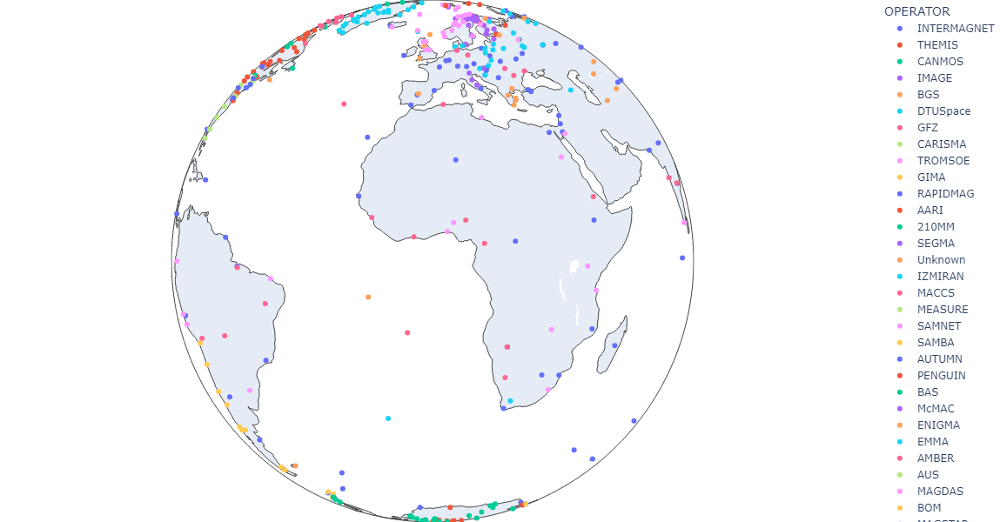

In [5]:
# Fetch station info from .csv and plot on a nice spinnable globe.
conjugate_stations = pd.read_csv('conjugate_stations.csv') # TODO: FIX THIS FILE!
conjugate_stations.Code

stations = pd.read_csv('20220726-04-17-supermag-stations.csv', sep = ',')   # edited version of this spreadsheet
# stations = stations[stations.IAGA.isin(conjugate_stations.Code)] # Plot only the polar stations

# Plot stations:

fig = px.scatter_geo(stations, 
                     lat = stations.GEOLAT,
                     lon = stations.GEOLON,
                     color="OPERATOR", # size of markers, "pop" is one of the columns of gapminder
                     hover_name = "STATION-NAME", 
                     # text = "IAGA"
                     )
fig.update_geos(projection_type="orthographic")
fig.update_layout(height=600, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#TODO: Overplot 40 deg magnetic meridian .... maybe I can pull this from geopack?


### Check Magnetic Meridian
Consider only the cases where transients occurred within +/-2 hours local time of the 40-degree magnetic meridian. This region is selected because of the density of ground stations available in both hemispheres; if time permits, other meridians will also be examined.

To check this, we'll pull satellite coordinates from https://cdaweb.gsfc.nasa.gov/. Using orbit parameters for spacecraft of interest (e.g., `THA_OR_SSC`), we can find their positions in a cylindrical coordinate system around Earth. We can then check if their longitude in SM coordinates is within 60&deg; of the latitude of our ground stations, since 60&deg; maps to +/- 2 hours out of 24.

Let's eliminate those events from the THEMIS event list where either spacecraft is outside the 2 hour window. 

In [6]:
# Drop all rows where SM_LON for either spacecraft is outside a window of 40 degrees plus or minus 30 degrees. 
# (This corresponds to a range of +/- 2 hours.)

with open('themis_event_list_with_coords.pkl', 'rb') as f:
    themis_events = pickle.load(f)
    
themis_events = themis_events.dropna()    # drop rows with missing values



pm = 30   # 30 degrees of margin

# themis_filtered = themis_events[themis_events['S1_SM_LON'] <= 40 + pm]
# themis_filtered = themis_events.drop(themis_events[(themis_events['S1_SM_LON'] <= 40 - pm) ].index)
                                                  #  | (themis_events['S1_SM_LON'] >= 40 + pm)
                                                  #  | (themis_events['S2_SM_LON'] <= 40 - pm)
                                                  #  | (themis_events['S2_SM_LON'] >= 40 + pm)
                                                  # ].index)
themis_events = themis_events.drop(themis_events[(themis_events['S1_SM_LON'] <= 40 - pm) ].index)
themis_events = themis_events.drop(themis_events[(themis_events['S1_SM_LON'] >= 40 + pm) ].index)
# themis_events = themis_events.drop(themis_events[(themis_events['S2_SM_LON'] <= 40 - pm) ].index)
# themis_events = themis_events.drop(themis_events[(themis_events['S2_SM_LON'] >= 40 + pm) ].index)

# themis_events['S2_SM_LON'].astype(int)

themis_events

,Jet Number,Ref Spacecraft,Start,End,S1_SM_LON
Max,,,,,
2012-12-16 23:56:43,2,A,2012-12-16/23:56:31,2012-12-16/23:57:07,19.5236
2012-12-17 00:00:14,3,A,2012-12-17/00:00:10,2012-12-17/00:01:26,19.7288
2012-12-17 00:06:13,4,A,2012-12-17/00:06:03,2012-12-17/00:06:37,20.0407
2012-12-17 00:08:48,5,A,2012-12-17/00:08:35,2012-12-17/00:09:34,20.1425
2012-12-28 11:51:23,6,A,2012-12-28/11:51:00,2012-12-28/11:51:28,11.2758
...,...,...,...,...,...
2018-10-17 03:53:06,744,E,2018-10-17/03:52:23,2018-10-17/03:53:18,14.4693
2018-10-19 13:11:30,822,E,2018-10-19/13:11:13,2018-10-19/13:11:45,10.5147
2018-10-19 13:54:30,823,E,2018-10-19/13:53:50,2018-10-19/13:57:06,11.9895


## Generate Survey Plots

The goal is to generate survey plots similar to Figure 2:
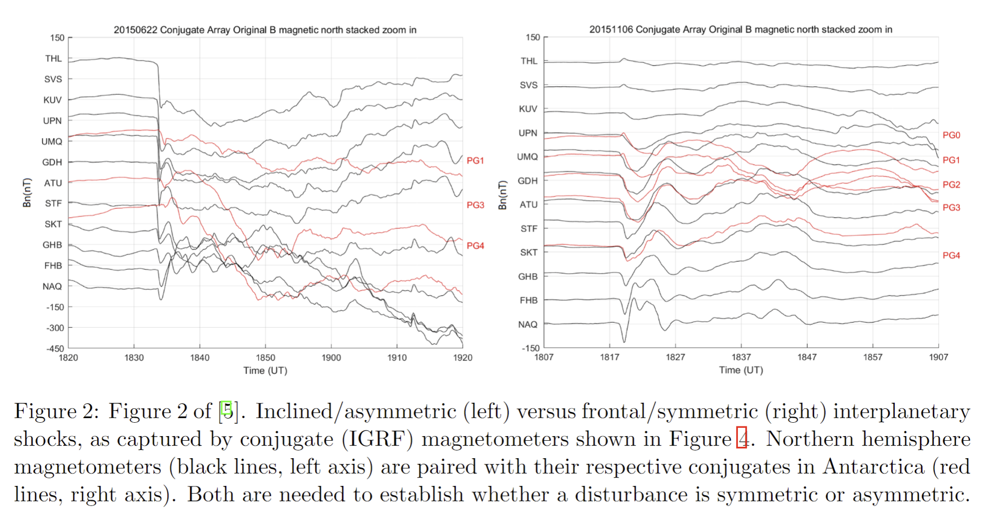

....and Figure 3: 
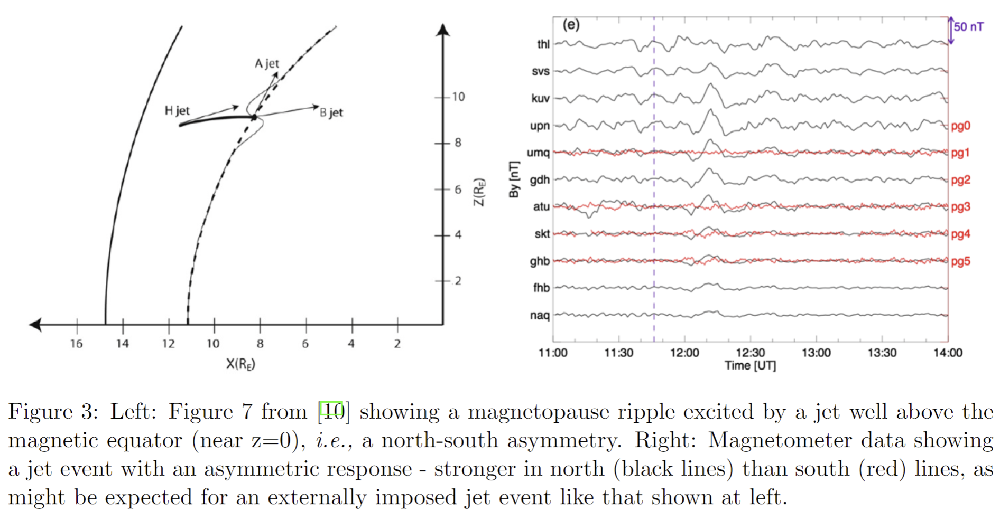

In [7]:
# Magnetometer stackplots: 
%matplotlib inline
events      = [{'datetime':datetime.datetime(2016, 1, 25, 6, 0, 0),'label':'Test'}]
magfig(is_saved = True, events = events)
magfig(is_saved = True,  start = datetime.datetime(2016, 6, 28, 5, 18, 0), end = datetime.datetime(2016, 6, 29, 5, 58, 0))
magfig(is_saved = True,  start = datetime.datetime(2008, 6, 16, 10, 20, 0), end = datetime.datetime(2008, 6, 16, 17, 30, 0))

Looks like output/2016-01-24 00:00:00_Bz.png has already been generated.
Looks like output/2016-06-28 05:18:00_Bz.png has already been generated.
Looks like output/2008-06-16 10:20:00_Bz.png has already been generated.


Now let's use that to crunch plots for all the THEMIS events.

In [8]:
# for idx in tqdm(mms_events.index):
#     # foo = magfig(start = idx-datetime.timedelta(hours = 1), end = idx + datetime.timedelta(hours = 1), is_saved = True)
#     foo = magfig(parameter = 'MAGNETIC_NORTH_-_H', start =  idx-datetime.timedelta(hours = 1), end = idx + datetime.timedelta(hours = 1), is_saved = True)

## Find Band-Integrated ULF Power
In parallel, use automated data processing techniques to quantify band-integrated ULF wave power before, during, and after each event at each magnetometer station, as well as identify peaks in the power spectrum. The same tools will be used as in past statistical studies of ULF waves (e.g.,[23](https://doi.org/10.1029/2007ja012483) and [13](https://doi.org/10.1029/2021ja029115)). 

Here's what the survey plot is supposed to look like: 
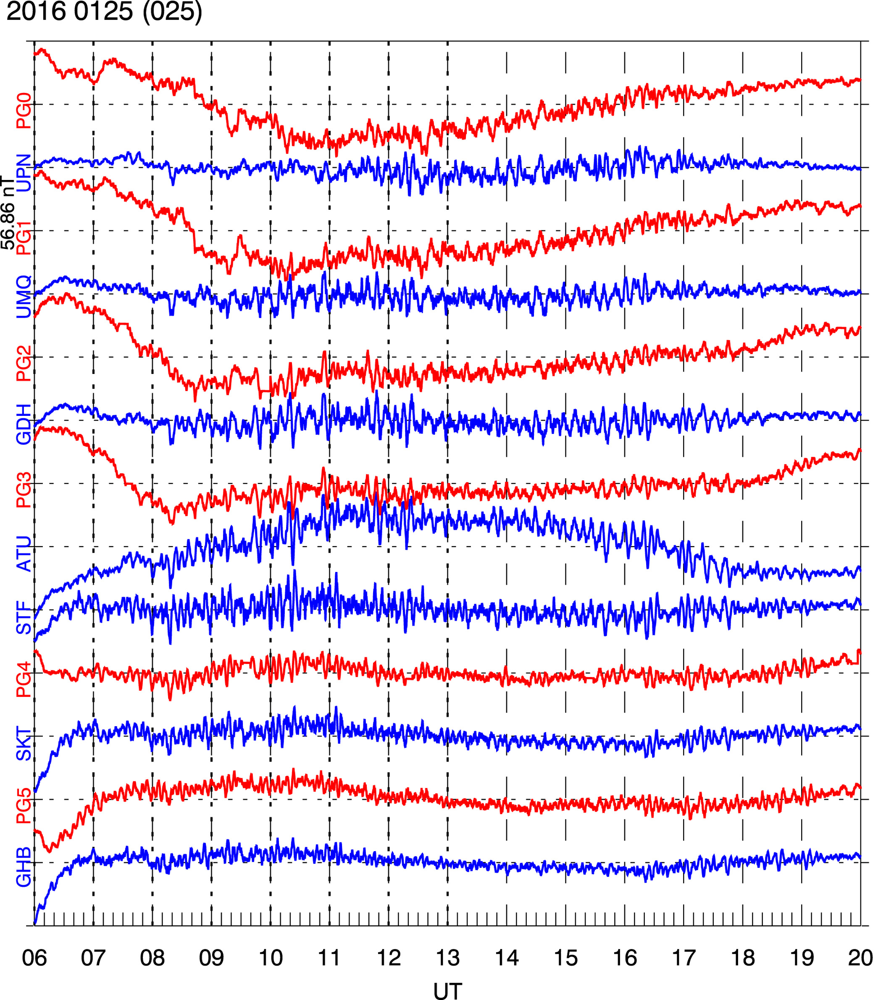!

From [13](https://doi.org/10.1029/2021ja029115):
In this study we have found 65 cases of impacting jets using observations from the Multiscale Magnetospheric mission during 2015–2017. We examine their geoeffectiveness using ground-based magnetometers (GMAGs). From our statistics we find that GMAGs observe responses as fluctuations in the geomagnetic field with amplitudes of 34 nT, frequencies of 1.9 mHz, and damping times of 370 s. Further, the parallel length and the maximum dynamic pressure of the jet dictate the amplitude of the observed GMAG response. Longer and higher pressure jets inducing larger amplitude responses in GMAG horizontal components. The median time required for the signal to be detected by GMAGs is 190 s. We also examine if jets can be harmful for human infrastructure and cannot exclude that such events could exist.

From [23](https://doi.org/10.1029/2007ja012483):
Pc5 pulsation parameters are derived from the GOES 8 magnetic field measurements at geosynchronous orbit at ∼10° magnetic latitude. The pulsations are quantified by three parameters: Sy, total power of the azimuthal magnetic field component in the 1.6- to 6.7-mHz Pc5 band; Sz, total power of the field-aligned (compressional) component in the same band; and Stor, the azimuthal power of narrow-band Pc5 oscillations attributed to the fundamental toroidal standing Alfvén waves. All parameters are computed in non-overlapping 1-h time windows and then used in linear correlation analysis. We find that all pulsation parameters are positively correlated with Psw and VarPsw with a correlation coefficient of up to ∼0.7 on the dayside. While the correlation of pulsation parameters with the solar wind velocity and density is also positive, the correlation coefficients are smaller. We discuss three mechanisms relevant to the observed Psw and VarPsw control of pulsation power: (1) solar wind-forcing of magnetic pulsations (breathing mode); (2) Psw control of the magnetopause-satellite distance, which results in the Psw dependence of the amplitude of surface waves observed at the satellite; and (3) coupling of impulsively excited fast mode waves to toroidal standing Alfvén waves.

## Generate plots of wave power vs. latitude
"Generate survey plots showing the wave power as a function of latitude in both hemispheres, as has been done in past studies (e.g., [24](https://doi.org/10.1029/2020ja028048)), and use these as further tools to quantify north-south hemisphere asymmetries of wave power and spatial localization of wave activity."

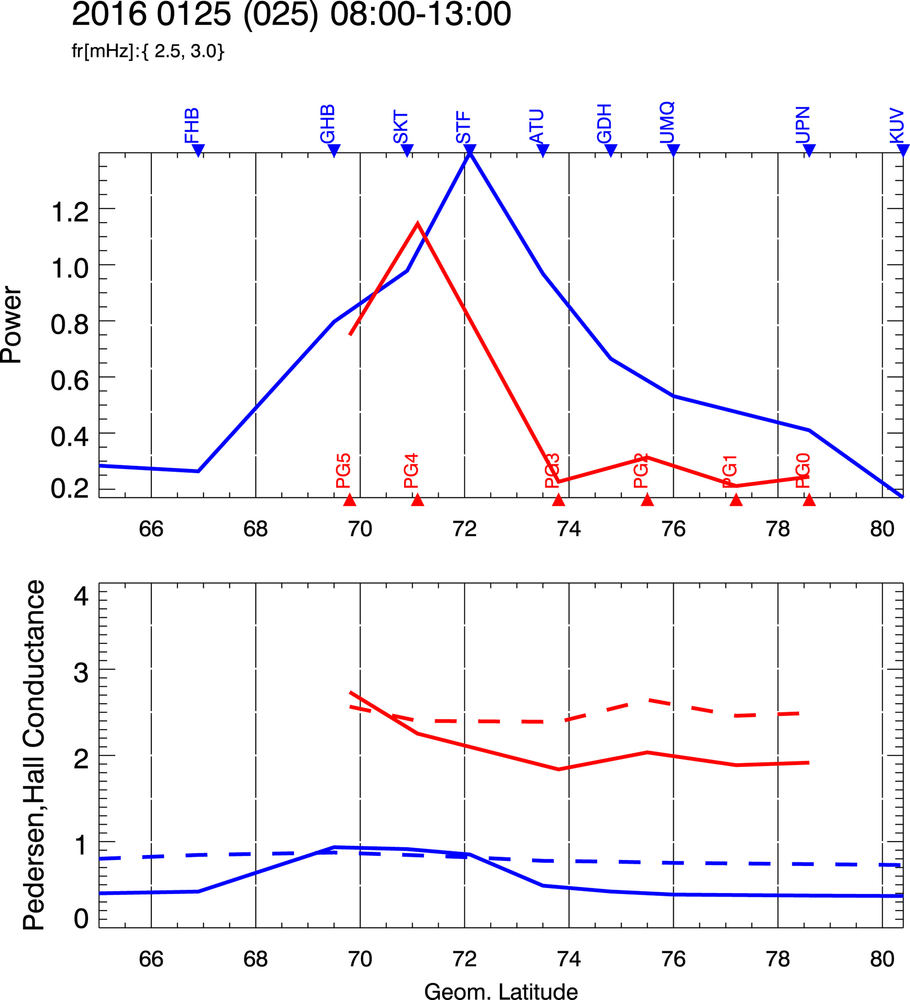

(Latitudinal profiles for the Northern (blue lines) and Southern (red lines) hemispheres during the time interval 08-13 UT, January 25, 2016: (upper panel) the spectral amplitude density [in nT/Hz1/2] in the frequency band 2.5–3.0 mHz of the Bx component; (bottom panel) the Pedersen (solid line) and Hall (dashed line) ionospheric conductances. Conductances were estimated with the use of the OP model. The position of stations in magnetic latitude is marked by filled triangles.)


<nobr>![TODO](https://img.shields.io/badge/TODO-orange)</nobr> To quantify Pc5 wave power, write a function to:
- [x] Take the Fourier transform of each station's data.
- [ ] Mask the results to only look at the applicable range for Pc5 waves (1-10 mHz, e.g.; the plot I'm looking to replicate used 2.5–3.0 mHz)
- [ ] Use `scipy.signal.welch` to find power spectral density.
- [ ] Use trapezoidal integration (probably also from scipy) to find a value for integrated wave power in the range of interest. 
- [x] Produce a dataframe with (at least) two columns: station ID and integrated wave power. (May want to merge in lat/lon data for each station for ease of use.)
- [ ] Line plot wave power vs latitude. The peak of the latitude plot should then be the latitude of the disturbance producing the wave.

100% [..........................................................................] 7869948 / 7869948


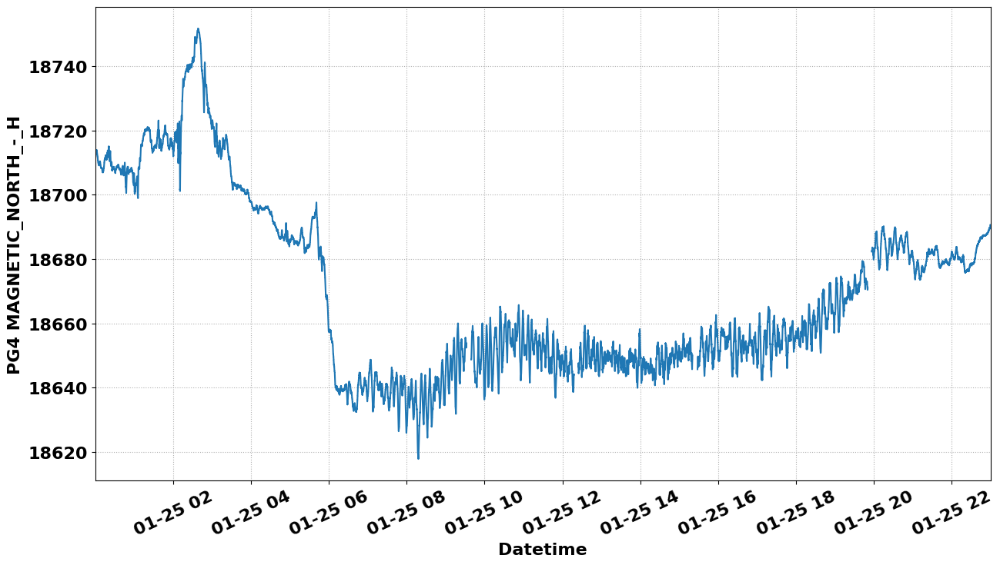

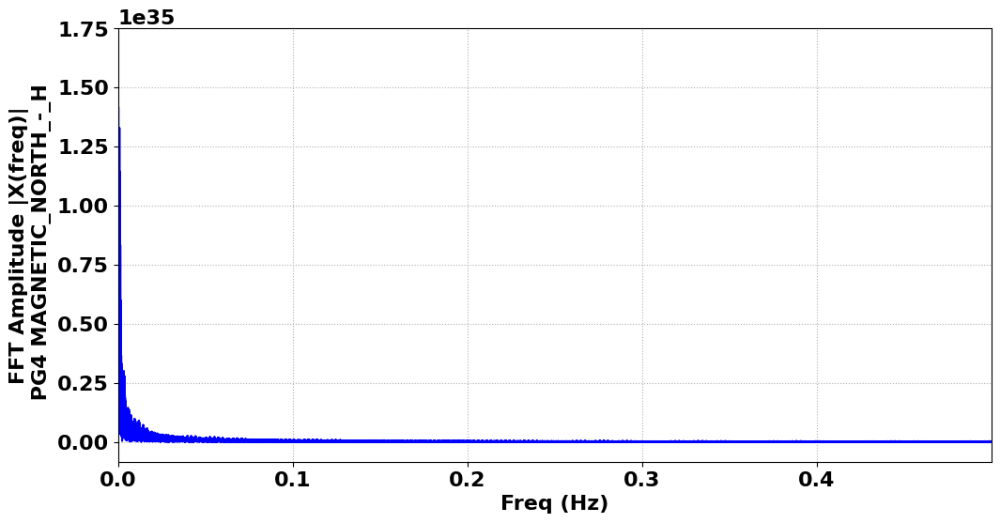

/tmp/ipykernel_1839/999524665.py:59: RuntimeWarning:

divide by zero encountered in divide



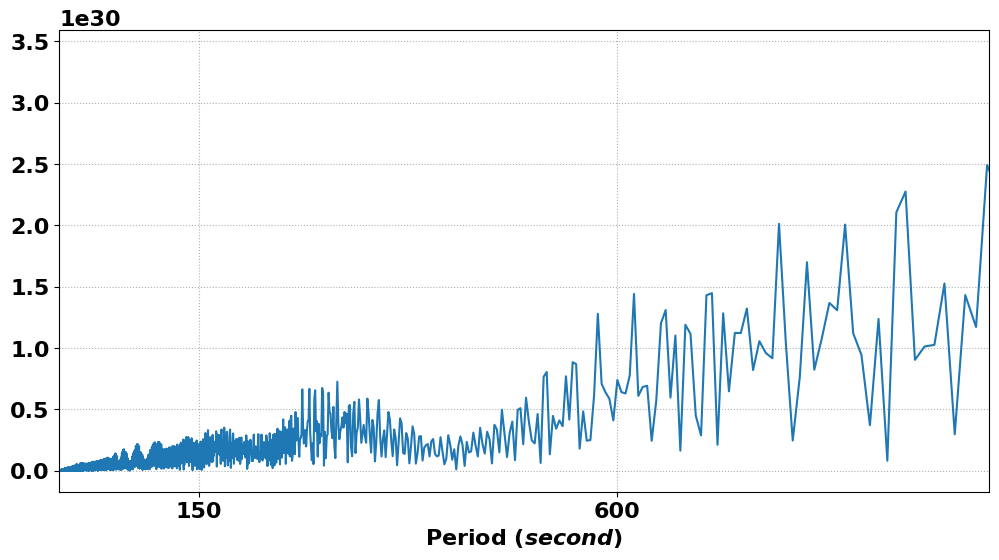

0.11539855072463764

In [9]:
from scipy.fft import fft

magname = 'pg4'

parameter = 'MAGNETIC_NORTH_-_H'#'VERTICAL_DOWN_-_Z'
start = datetime.datetime(2016, 1, 25, 0, 0, 0) 
end = datetime.datetime(2016, 1, 25, 23, 0, 0)

# # print('Plotting data for Antarctic magnetometer #' + str(idx+1) + ': ' + magname.upper())
data = cdas.get_data(
    'sp_phys',
    'THG_L2_MAG_'+ magname.upper(),
    start,
    end,
    ['thg_mag_'+ magname]
)
# data['UT'] = pd.to_datetime(data['UT'])#, unit='s')
x =data['UT']
y =data[parameter]


y = reject_outliers(y) # Remove power cycling artifacts on, e.g., PG2.
# fy = np.fft.fft(y)
# fy = fft(y)

plt.plot(x, y)
# plt.plot(fy)
# plt.xlim([.001, .01])
plt.xlabel('Datetime')
plt.ylabel(magname.upper() + ' ' + parameter)
plt.xticks(rotation=25) 
plt.show()

########################################## Take Fourier xfrm:

X = fft(data[parameter])
N = len(X)                                  # N: Length of data vector
n = np.arange(N)                            
# get the sampling rate
sr = 1# / (60*60)
T = N/sr
freq = n/T 

# Get the one-sided specturm
n_oneside = N//2
# get the one side frequency
f_oneside = freq[:n_oneside]

plt.figure(figsize = (12, 6))
plt.plot(f_oneside, np.abs(X[:n_oneside]), 'b')
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Amplitude |X(freq)|\n ' + magname.upper() + ' ' + parameter)
plt.show()

# # convert frequency to hour
# t_h = 1/f_oneside / (60 * 60)

# convert to seconds:
t_s = 1/f_oneside

plt.figure(figsize=(12,6))
plt.plot(t_s, np.abs(X[:n_oneside])/n_oneside)
# plt.xticks([12, 24, 84, 168])
plt.xticks([150, 600])
plt.xlim(0, 1000)
plt.xlabel('Period ($second$)')
plt.show()

############################### Integrate:
# sum(f_oneside[((f_oneside>=1.66=/1000) & (f_oneside<=6.66/1000))])
sum(f_oneside[((f_oneside>=2.5/1000) & (f_oneside<=3/1000))])

100% [..........................................................................] 7869948 / 7869948
5001 5001


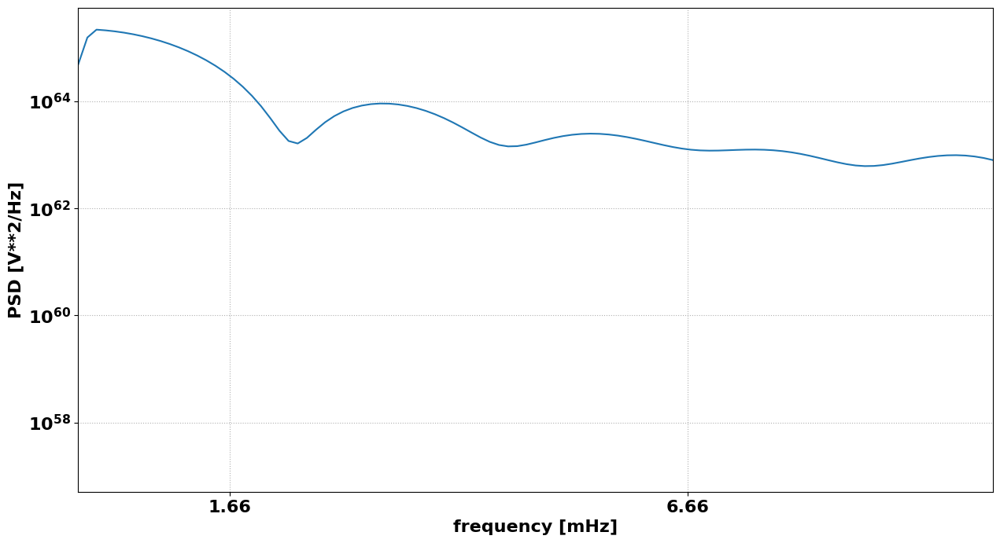

In [10]:
# TESTING SCIPY WELCH W/ SIGNAL

magname = 'pg4'

parameter = 'MAGNETIC_NORTH_-_H'#'VERTICAL_DOWN_-_Z'
start = datetime.datetime(2016, 1, 25, 0, 0, 0) 
end = datetime.datetime(2016, 1, 25, 23, 0, 0)

data = cdas.get_data(
    'sp_phys',
    'THG_L2_MAG_'+ magname.upper(),
    start,
    end,
    ['thg_mag_'+ magname]
)
# data['UT'] = pd.to_datetime(data['UT'])#, unit='s')
x =data['UT']
y =data[parameter]
sr = 1 # sampling at 1 Hz

f, Pxx_den = signal.welch(y, sr, nperseg=10000)
print(len(f), len(Pxx_den))
plt.semilogy(f*1000, Pxx_den)
# plt.ylim([0.5e-3, 1])
plt.xlabel('frequency [mHz]')
plt.xticks([1.66, 6.66])
plt.xlim([0, 10])
plt.ylabel('PSD [V**2/Hz]')
plt.show()

# Calculate noise power:
# np.mean(Pxx_den[1.66:6.66])
# np.trapz(Pxx_den[2:10])
# np.trapz(fft(y)[1:3])
# ((f>=2/1000) & (f<=3/1000))


In [11]:
# Starting code to create wave power figure... plug in a functional version of wavepwr().

foo = stations.copy()
foo['WAVEPWR'] = foo.apply(lambda row : wavepwr(row['IAGA']), axis = 1)#wavepwr(foo['IAGA'])
foo['HEMISPHERE'] = np.sign(foo.AACGMLAT)
foo.HEMISPHERE = foo['HEMISPHERE'].map({1:'Arctic', -1:'Antarctic', 0:'Error'})
foo['ABSLAT'] = abs(foo.AACGMLAT)
px.scatter(foo.WAVEPWR, abs(foo.AACGMLAT))
foo = foo.sort_values('ABSLAT')

df = px.data.iris()
fig = px.line(foo, x='ABSLAT', y="WAVEPWR", color='HEMISPHERE', hover_data=['IAGA'],
                labels={
                     'ABSLAT': "Latitude",
                     "WAVEPWR": "Wave Power",
                     "AACGMLAT": "Latitude",
                     "HEMISPHERE": "Hemisphere"
                 },
                title="Wave Power")
fig.update_layout({
    # 'plot_bgcolor': 'rgba(0, 0, 0, 0)',    # ditch gray background
    # 'paper_bgcolor': 'rgba(0, 0, 0, 0)',   # transparent figure
})

fig.update_traces(connectgaps=True)

fig.show()

TypeError: wavepwr() missing 3 required positional arguments: 'parameter', 'start', and 'end'

In [ ]:
# Starting code to create wave power figure... plug in a functional version of wavepwr().

# foo = stations.copy()
# foo['WAVEPWR'] = foo.apply(lambda row : wavepwr(row['IAGA']), axis = 1)#wavepwr(foo['IAGA'])
# foo['HEMISPHERE'] = np.sign(foo.AACGMLAT)
# foo.HEMISPHERE = foo['HEMISPHERE'].map({1:'Arctic', -1:'Antarctic', 0:'Error'})
# foo['ABSLAT'] = abs(foo.AACGMLAT)
# # px.scatter(foo.WAVEPWR, abs(foo.AACGMLAT))
foo = foo.sort_values('ABSLAT')


df = px.data.iris()
fig = px.line(foo.loc[foo['HEMISPHERE'] == 'Arctic'], x='ABSLAT', y="WAVEPWR", color='HEMISPHERE', hover_data=['IAGA'], line_shape = 'spline',
                labels={
                     'ABSLAT': "Latitude",
                     "WAVEPWR": "Wave Power",
                     "AACGMLAT": "Latitude",
                     "HEMISPHERE": "Hemisphere"
                 },
                title="Wave Power")
fig.add_trace(go.Scatter(x=foo['ABSLAT'], y=foo["WAVEPWR"]))
fig.update_layout({
    # 'plot_bgcolor': 'rgba(0, 0, 0, 0)',    # ditch gray background
    # 'paper_bgcolor': 'rgba(0, 0, 0, 0)',   # transparent figure
})

fig.show()

In [ ]:
import matplotlib.dates as mdates

# For power plots:
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from scipy import signal
from scipy.fft import fft
from scipy.signal import butter, filtfilt, stft, spectrogram
import datetime as dt



magspect()

## Visual Inspection - What to Look For
cf. https://agupubs.onlinelibrary.wiley.com/doi/epdf/10.1029/2022GL099768
How did they separate out single events from "recurrent" events? May want to apply above. 

<nobr>![TODO](https://img.shields.io/badge/TODO-orange)</nobr> Generate wave power plots for all the events on Wang's list and classify them as symmetric or asymmetric. Is this property tied to whether the events were identified as isolated or recurrent? 

(Notion: Could "recurrent" events be associated with a relaxation oscillator circuit model?)


## Create Timeline

<nobr>![TODO](https://img.shields.io/badge/TODO-orange)</nobr> Greate a Gantt chart or other means of graphically depicting when THEMIS orbit (cf. http://themis.ssl.berkeley.edu/summary.php?year=2018&month=10&day=20&hour=0024&sumType=orb&type=orbit) is out of whack vs when mag coverage is on (e.g., August - October is generally down... http://themis.ssl.berkeley.edu/gmag/gmag_list.php?selyear=4000&selmonth=13&smap=on&sinfo=on&saelist=on&ae=on).
Pulling the THEMIS orbit illustrations directly for each event could work.


Plotly express will let us make a Gantt chart of events and instrument availability. 

It would be good to see the following in this inventory:
- [ ] Events from Wang et al. (www.doi.org/10.1029/2022GL099768), color-coded for isolated vs. recurrent events.
- [ ] Events from Norenius et al. (www.doi.org/10.1029/2021JA029115)
- [ ] Data availability for THEMIS satellites (i.e., times when they are within +/- 2 hours)
- [ ] Data availability for all Arctic magnetometers.
- [ ] Data availability for Antarctic magnetometers.

Here's a literature table:

| Source                                      | Number of Events | Date Range | Pc5 Definition           | Instruments  | Key Conclusions                                                                         |
|---------------------------------------------|------------------|------------|--------------------------|--------------|-----------------------------------------------------------------------------------------|
| Norenius (www.doi.org/10.1029/2021JA029115) | 65               | 2015-2016  | -                        | MMS, GMAG    | Parallel length and maximum dynamic pressure of jet dictate amplitude of GMAG response  |
| Wang (www.doi.org/10.1029/2022GL099768)     | 644              | 2008-2016  | 1.66-6.66 mHz (150-600 s) | THEMIS, GMAG | Recurrence time of recurrent HSJs likely determines the frequencies of ULF oscillations |

In [ ]:
wang_events = pd.read_excel('https://figshare.com/ndownloader/files/37635137')

wang_events['THEMIS'] = wang_events['THEMIS'].str.upper()
wang_events = wang_events.rename(columns={"Initial time of HSJ": "Start", "End time of HSJ": "End", "THEMIS":"Ref Spacecraft"})
wang_events['Start']= pd.to_datetime(wang_events['Start']).dt.normalize() # let's just see the date...
wang_events['End']= pd.to_datetime(wang_events['End']).dt.normalize() + timedelta(days=1) # 1 day duration makes it more visible in the data inventory
wang_events['Category'] = np.where(wang_events['sub HSJs'] == 1, 'Isolated', 'Recurrent')

wang_events

fig = px.timeline(wang_events, x_start="Start", x_end="End", y = "Ref Spacecraft", color="Category")
fig.update_yaxes(autorange="reversed")
fig.show()

Let's generate plots for all the Wang events. Then I can manually identify them as symmetrical or asymmetrical.

In [ ]:
# Find the set of days where there were jet events.

# display(wang_events)

# wang_events = wang_events.set_index("Start")
display(wang_events)


df = wang_events
df['Start'] = pd.to_datetime(df["Start"])
days = Counter(df["Start"])

for day in tqdm(days):
    clear_output(wait=True)   # workaround bc tqdm isn't working properly...
    try:
        start = pd.to_datetime(day)
        end = start + datetime.timedelta(days=1)
        # print(str(start) + ' until ' + str(end))

        # Filter data between two dates
        filtered_df = df#.loc[(df['Max'] >= start)
                             # & (df['Max'] < end)]
        # events = filtered_df[['Max', 'Jet Number']].values.tolist()
        events = filtered_df#[['Max']].rename(columns={"Max": "datetime"}).to_dict('records')

        # # Pull data from each mag to make each figure. Not the most efficient, but shouldn't need to do it more than once.
        magfig(parameter = 'Bx', start = start, end = end, is_saved = True, events = events) 
        magfig(parameter = 'By', start = start, end = end, is_saved = True, events = events) 
        magfig(parameter = 'Bz', start = start, end = end, is_saved = True, events = events) 
        
        print('Attempting power plot....')
        # Pull data from each mag to make each figure. Not the most efficient, but shouldn't need to do it more than once.
        magspect(parameter = 'Bx', start = start, end = end, is_saved = True, events = events) 
        magspect(parameter = 'By', start = start, end = end, is_saved = True, events = events) 
        magspect(parameter = 'Bz', start = start, end = end, is_saved = True, events = events) 
        
    except Exception as e:
        print(e)
        continue
    mpl.pyplot.close()
#     
    # TODO: convert Max/Jet numbers of jet events into event lists per code below, run magplots
    
    
    # magfig(is_saved = True, events = events)

In [ ]:
# Find the set of days where there were jet events.

display(themis_events)

days = Counter(themis_events.index.date)

df = themis_events.reset_index()
df['Max'] = pd.to_datetime(df["Max"])

for day in tqdm(days):
    clear_output(wait=True)   # workaround bc tqdm isn't working properly...
    try:
        start = pd.to_datetime(day)
        end = start + datetime.timedelta(days=1)
        # print(str(start) + ' until ' + str(end))

        # Filter data between two dates
        filtered_df = df.loc[(df['Max'] >= start)
                             & (df['Max'] < end)]
        # events = filtered_df[['Max', 'Jet Number']].values.tolist()
        events = filtered_df[['Max', 'Jet Number']].rename(columns={"Max": "datetime", "Jet Number": "label"}).to_dict('records')

        # # Pull data from each mag to make each figure. Not the most efficient, but shouldn't need to do it more than once.
        magfig(parameter = 'Bx', start = start, end = end, is_saved = True, events = events) 
        magfig(parameter = 'By', start = start, end = end, is_saved = True, events = events) 
        magfig(parameter = 'Bz', start = start, end = end, is_saved = True, events = events) 
        
        print('Attempting power plot....')
        # Pull data from each mag to make each figure. Not the most efficient, but shouldn't need to do it more than once.
        magspect(parameter = 'Bx', start = start, end = end, is_saved = True, events = events) 
        magspect(parameter = 'By', start = start, end = end, is_saved = True, events = events) 
        magspect(parameter = 'Bz', start = start, end = end, is_saved = True, events = events) 
        
    except Exception as e:
        print(e)
        continue
    mpl.pyplot.close()
#     
    # TODO: convert Max/Jet numbers of jet events into event lists per code below, run magplots
    
    
    # magfig(is_saved = True, events = events)

In [ ]:
norenius_events = 

## My Next Steps
- [ ] Code wave power plots
- [X] Read HSJ paper (10.1029/2022GL099768)
- [ ] Delete, re-run and magick time series plots